In [163]:
import os 
import rk_solver_cpp
from scipy.integrate import ode
import numpy as np
import matplotlib.pyplot as plt
import SundialsPy as SP
import cantera as ct
import time
from typing import Tuple, List, Dict, Any, Optional

In [164]:
# ============================================================================
# CHEMISTRY SETUP FUNCTIONS
# ============================================================================

def setup_combustion_chemistry(mechanism: str, fuel: str, oxidizer: str, 
                              phi: float, temperature: float, pressure: float) -> ct.Solution:
    """Set up the combustion chemistry with Cantera.
    
    Args:
        mechanism: Path to mechanism file
        fuel: Fuel species name
        oxidizer: Oxidizer mixture string
        phi: Equivalence ratio
        temperature: Initial temperature (K)
        pressure: Initial pressure (Pa)
    
    Returns:
        gas: Initialized Cantera gas object
    """
    gas = ct.Solution(mechanism)
    gas.set_equivalence_ratio(phi, fuel, oxidizer)
    gas.TPX = temperature, pressure, gas.X
    return gas

def get_initial_state(gas: ct.Solution) -> np.ndarray:
    """Get initial state vector [T, Y1, Y2, ...].
    
    Args:
        gas: Cantera gas object
    
    Returns:
        y: Initial state vector
    """
    return np.hstack([gas.T, gas.Y])

def reset_chemistry_state(gas: ct.Solution, phi: float, fuel: str, oxidizer: str, 
                         temperature: float, pressure: float) -> Tuple[ct.Solution, np.ndarray]:
    """Reset chemistry to initial conditions.
    
    Args:
        gas: Cantera gas object
        phi: Equivalence ratio
        fuel: Fuel species name
        oxidizer: Oxidizer mixture string
        temperature: Initial temperature (K)
        pressure: Initial pressure (Pa)
    
    Returns:
        gas: Reset gas object
        y: Reset state vector
    """
    gas.set_equivalence_ratio(phi, fuel, oxidizer)
    gas.TPX = temperature, pressure, gas.X
    y = np.hstack([gas.T, gas.Y])
    return gas, y

In [165]:
# ============================================================================
# ODE SYSTEM DEFINITION
# ============================================================================

def combustion_rhs(t: float, y: np.ndarray, gas: ct.Solution, pressure: float) -> np.ndarray:
    """Right-hand side of the combustion ODE system.
    
    Args:
        t: Current time
        y: Current state vector [T, Y1, Y2, ...]
        gas: Cantera gas object
        pressure: Constant pressure
    
    Returns:
        dydt: Time derivatives [dT/dt, dY1/dt, dY2/dt, ...]
    """
    # Extract temperature and mass fractions
    T = y[0]
    Y = y[1:]
    
    # Update the gas state
    gas.TPY = T, pressure, Y
    
    # Get thermodynamic properties
    rho = gas.density_mass
    wdot = gas.net_production_rates
    cp = gas.cp_mass
    h = gas.partial_molar_enthalpies
    
    # Calculate temperature derivative (energy equation)
    dTdt = -(np.dot(h, wdot) / (rho * cp))
    
    # Calculate species derivatives (mass conservation)
    dYdt = wdot * gas.molecular_weights / rho
    
    # Combine into full derivative vector
    return np.hstack([dTdt, dYdt])

In [190]:
# ============================================================================
# SOLVER CREATION FUNCTIONS
# ============================================================================

def create_sundials_solver(method: str, y: np.ndarray, t: float, system_size: int, rtol: float, atol: np.ndarray, 
                          gas: ct.Solution, pressure: float) -> Any:
    """Create a SUNDIALS solver.
    
    Args:
        method: Solver method ('cvode_bdf', 'cvode_adams', 'arkode_erk')
        system_size: Size of the ODE system
        rtol: Relative tolerance
        atol: Absolute tolerance array
        gas: Cantera gas object
        pressure: Constant pressure
    
    Returns:
        solver: Initialized SUNDIALS solver
    """
    if method == 'cvode_bdf':
        solver = SP.cvode.CVodeSolver(
            system_size=system_size,
            rhs_fn=lambda t, y: combustion_rhs(t, y, gas, pressure),
            iter_type=SP.cvode.IterationType.NEWTON
        )
    elif method == 'cvode_adams':
        solver = SP.cvode.CVodeSolver(
            system_size=system_size,
            rhs_fn=lambda t, y: combustion_rhs(t, y, gas, pressure),
            iter_type=SP.cvode.IterationType.FUNCTIONAL
        )
    elif method == 'arkode_erk':
        solver = SP.arkode.ARKodeSolver(
            system_size=system_size,
            explicit_fn=lambda t, y: combustion_rhs(t, y, gas, pressure),
            implicit_fn=None,
            butcher_table=SP.arkode.ButcherTable.ARK548L2SA_ERK_8_4_5
        )
    else:
        raise ValueError(f"Unknown SUNDIALS method: {method}")
    
    solver.initialize(y, t, rtol, atol)
    return solver

def create_cpp_solver(method: str, t: float, y: np.ndarray, t_end: float, 
                     rtol: float, atol: float, gas: ct.Solution, pressure: float) -> Any:
    """Create a C++ RK solver.
    
    Args:
        method: Solver method ('cpp_rk23', 'cpp_rk45', etc.)
        t: Current time
        y: Current state
        t_end: End time
        rtol: Relative tolerance
        atol: Absolute tolerance
        gas: Cantera gas object
        pressure: Constant pressure
    
    Returns:
        solver: Initialized C++ solver
    """
    if method == 'cpp_rk23':
        return rk_solver_cpp.RK23(
            lambda t, y: combustion_rhs(t, y, gas, pressure), 
            float(t), np.array(y), float(t_end), rtol=rtol, atol=atol
        )
    else:
        raise ValueError(f"Unknown C++ method: {method}")

def create_scipy_solver(method: str, t: float, y: np.ndarray, rtol: float, atol: float,
                       gas: ct.Solution, pressure: float) -> Any:
    """Create a SciPy solver.
    
    Args:
        method: Solver method ('scipy_rk23', 'scipy_bdf', etc.)
        t: Current time
        y: Current state
        rtol: Relative tolerance
        atol: Absolute tolerance
        gas: Cantera gas object
        pressure: Constant pressure
    
    Returns:
        solver: Initialized SciPy solver
    """
    method_parts = method.split('_')
    if len(method_parts) != 3:
        raise ValueError(f"Invalid SciPy method format: {method}")
    
    solver_type, method_name = method_parts[1], method_parts[2]
    solver = ode(lambda t, y: combustion_rhs(t, y, gas, pressure)).set_integrator(
        solver_type, method=method_name, rtol=rtol, atol=atol, nsteps=10000
    )
    solver.set_initial_value(y, t)
    return solver

def create_solver(method: str, gas: ct.Solution, y: np.ndarray, t: float, 
                 rtol: float, atol: float, t_end: Optional[float] = None) -> Any:
    """Create the appropriate solver based on method.
    
    Args:
        method: Solver method string
        gas: Cantera gas object
        y: Current state
        t: Current time
        rtol: Relative tolerance
        atol: Absolute tolerance
        t_end: End time (for some solvers)
    
    Returns:
        solver: Initialized solver
    """
    system_size = 1 + gas.n_species
    
    # Create absolute tolerance array
    if np.isscalar(atol):
        abs_tol = np.ones(system_size) * atol
    else:
        abs_tol = np.asarray(atol)
        if len(abs_tol) == 1:
            abs_tol = np.ones(system_size) * abs_tol[0]
    
    if method.startswith('cvode_') or method.startswith('arkode_'):
        return create_sundials_solver(method, y, t, system_size, rtol, abs_tol, gas, pressure)
    elif method.startswith('cpp_'):
        return create_cpp_solver(method, t, y, t_end, rtol, atol, gas, pressure)
    elif method.startswith('scipy_'):
        return create_scipy_solver(method, t, y, rtol, atol, gas, pressure)
    else:
        raise ValueError(f"Unknown solver method: {method}")

In [200]:
# ============================================================================
# INTEGRATION FUNCTIONS
# ============================================================================

def integrate_single_step(method: str, gas: ct.Solution, y: np.ndarray, t: float, 
                         timestep: float, rtol: float, atol: float) -> Dict[str, Any]:
    """Integrate one step with the specified method.
    
    Args:
        method: Solver method
        gas: Cantera gas object
        y: Current state
        t: Current time
        timestep: Time step size
        rtol: Relative tolerance
        atol: Absolute tolerance
    
    Returns:
        result: Dictionary with integration results
    """
    t_end = t + timestep
    previous_state = y.copy()
    
    try:
        # Create solver
        solver = create_solver(method, gas, y, t, rtol, atol, t_end)
        
        # Integrate
        start_time = time.time()
        
        if method.startswith('cpp_'):
            result = rk_solver_cpp.solve_ivp(solver, np.array(t_end))
            new_y = result['y'][-1]
        elif method.startswith('scipy_'):
            solver.integrate(t_end)
            new_y = solver.y
        else:  # SUNDIALS
            new_y = solver.solve_single(t_end)
        
        cpu_time = time.time() - start_time
        
        return {
            'success': True,
            't': t_end,
            'y': new_y,
            'cpu_time': cpu_time,
            'error': 0.0,
            'message': 'Success',
            'timed_out': False,
            'previous_state': previous_state
        }
        
    except Exception as e:
        return {
            'success': False,
            'y': previous_state,
            'cpu_time': 0.0,
            'error': float('inf'),
            'message': str(e),
            'timed_out': False,
            'previous_state': previous_state
        }

def run_integration_experiment(method: str, gas: ct.Solution, y0: np.ndarray, 
                             t0: float, end_time: float, timestep: float,
                             rtol: float, atol: float, species_to_track: List[str],
                             time_limit: float = 300.0) -> Dict[str, Any]:
    """Run a complete integration experiment with the specified method.
    
    Args:
        method: Solver method to test
        gas: Cantera gas object
        y0: Initial state
        t0: Start time
        end_time: End time
        timestep: Time step size
        rtol: Relative tolerance
        atol: Absolute tolerance
        species_to_track: List of species to monitor
        time_limit: Maximum allowed wall clock time in seconds (default 300s)
    
    Returns:
        results: Dictionary with complete integration results
    """
    # Initialize tracking arrays
    times = [t0]
    temperatures = [y0[0]]
    species_profiles = {spec: [y0[gas.species_index(spec) + 1]] for spec in species_to_track}
    cpu_times = []
    
    # Integration loop
    t = t0
    y = y0.copy()
    step_count = 0
    start_time = time.time()
    
    while t < end_time:
        # Check if time limit exceeded
        if time.time() - start_time > time_limit:
            print(f"Time limit of {time_limit}s exceeded after {step_count} steps")
            break
            
        result = integrate_single_step(method, gas, y, t, timestep, rtol, atol)
        
        if not result['success']:
            print(f"Step {step_count} failed: {result['message']}")
            break
        
        # Update state
        y = result['y']
        t = result['t']
        cpu_times.append(result['cpu_time'])
        step_count += 1
        
        # Record data
        times.append(t)
        temperatures.append(y[0])
        for spec in species_to_track:
            species_profiles[spec].append(y[gas.species_index(spec) + 1])
        
        print(f"Step {step_count} at time {t:.2e} - temperature {y[0]:.1f}K - CPU time {cpu_times[-1]:.2e}s - time taken {time.time() - start_time:.2f}s | {np.sum(cpu_times):.2e}s")
    
    total_wall_time = time.time() - start_time
    return {
        'method': method,
        'rtol': rtol,
        'atol': atol,   
        'times': np.array(times),
        'temperatures': np.array(temperatures),
        'species_profiles': species_profiles,
        'cpu_times': np.array(cpu_times),
        'total_cpu_time': np.sum(cpu_times),
        'total_wall_time': total_wall_time,
        'steps': step_count,
        'success': step_count > 0,
        'timed_out': total_wall_time > time_limit
    }

In [205]:
# ============================================================================
# MAIN EXPERIMENTAL SETUP
# ============================================================================

def setup_experiment_parameters(rtol=1e-6, atol=1e-8, end_time=1e-1, timestep=1e-5) -> Dict[str, Any]:
    """Set up the experimental parameters.
    
    Returns:
        params: Dictionary with experiment parameters
    """
    return {
        'mechanism': "large_mechanism/ch4_53species.yaml",
        'fuel': "CH4",
        'oxidizer': 'O2:1, N2:3.76',
        'phi': 1.0,
        'temperature': 1200.0,
        'pressure': ct.one_atm,
        'rtol': rtol,
        'atol': atol,
        'end_time': end_time,
        'timestep': timestep,
        'species_to_track': ['CH4', 'O2','CO2', 'H2O', 'OH', 'H']
    }

In [206]:
all_results = {}

methods = ['cvode_bdf', 'cvode_adams', 'arkode_erk', 'cpp_rk23', 'scipy_lsoda_none', 'scipy_vode_bdf', 'scipy_vode_adams']
tolerances = [(1e-6, 1e-8), (1e-8, 1e-10), (1e-12, 1e-14)]

In [207]:
def plot_single_experiment(results: Dict[str, Any], species_to_track: List[str]) -> None:
    """Plot results from a single integration experiment.
    
    Args:
        results: Results dictionary from run_integration_experiment
        species_to_track: List of species to plot
    """
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
    
    # Temperature plot
    ax1.plot(results['times'], results['temperatures'], 'b-', linewidth=2)
    ax1.set_xlabel('Time (s)')
    ax1.set_ylabel('Temperature (K)')
    ax1.set_title(f'Integration Results: {results["method"]} - rtol: {results["rtol"]} - atol: {results["atol"]}')
    ax1.grid(True, alpha=0.3)
    
    # Species profiles
    for spec in species_to_track:
        if spec in results['species_profiles']:
            ax2.plot(results['times'], results['species_profiles'][spec], label=spec)
    
    ax2.set_xlabel('Time (s)')
    ax2.set_ylabel('Mass Fraction')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    ax2.set_yscale('log')
    
    plt.tight_layout()
    plt.show()

Running cvode_bdf with tolerance (1e-06, 1e-08)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 3.53e-03s - time taken 0.00s | 3.53e-03s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 5.85e-04s - time taken 0.00s | 4.11e-03s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 8.74e-04s - time taken 0.01s | 4.99e-03s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 1.52e-03s - time taken 0.01s | 6.51e-03s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 6.12e-04s - time taken 0.01s | 7.12e-03s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 2.28e-03s - time taken 0.01s | 9.40e-03s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 1.09e-03s - time taken 0.01s | 1.05e-02s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 1.42e-03s - time taken 0.01s | 1.19e-02s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 3.56e-03s - time taken 0.02s | 1.55e-02s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 1.34e-03s - 

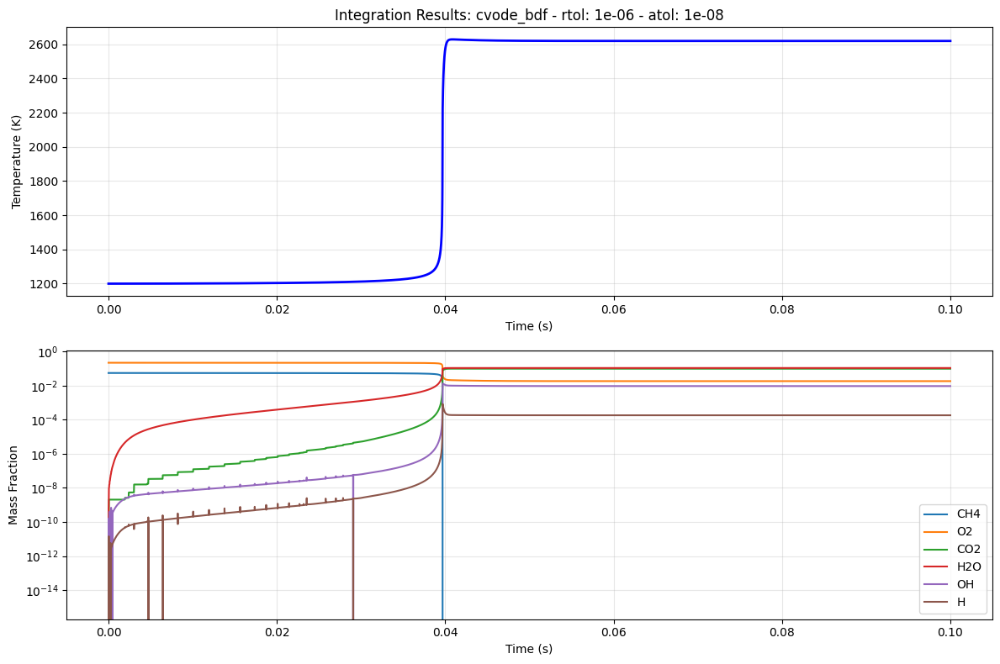

Running cvode_adams with tolerance (1e-06, 1e-08)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 2.22e-04s - time taken 0.00s | 2.22e-04s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 8.94e-04s - time taken 0.00s | 1.12e-03s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 1.03e-04s - time taken 0.00s | 1.22e-03s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 1.36e-04s - time taken 0.00s | 1.35e-03s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 1.28e-04s - time taken 0.00s | 1.48e-03s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 1.58e-04s - time taken 0.00s | 1.64e-03s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 1.22e-04s - time taken 0.00s | 1.76e-03s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 1.44e-04s - time taken 0.00s | 1.90e-03s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 1.39e-04s - time taken 0.00s | 2.04e-03s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 1.12e-04s 

[ERROR][rank 0][/home/conda/feedstock_root/build_artifacts/sundials-split_1742999320892/work/sundials/src/cvode/cvode.c:1428][CVode] At t = 0.0391395, mxstep steps taken before reaching tout.
CVODE solver error code: -1


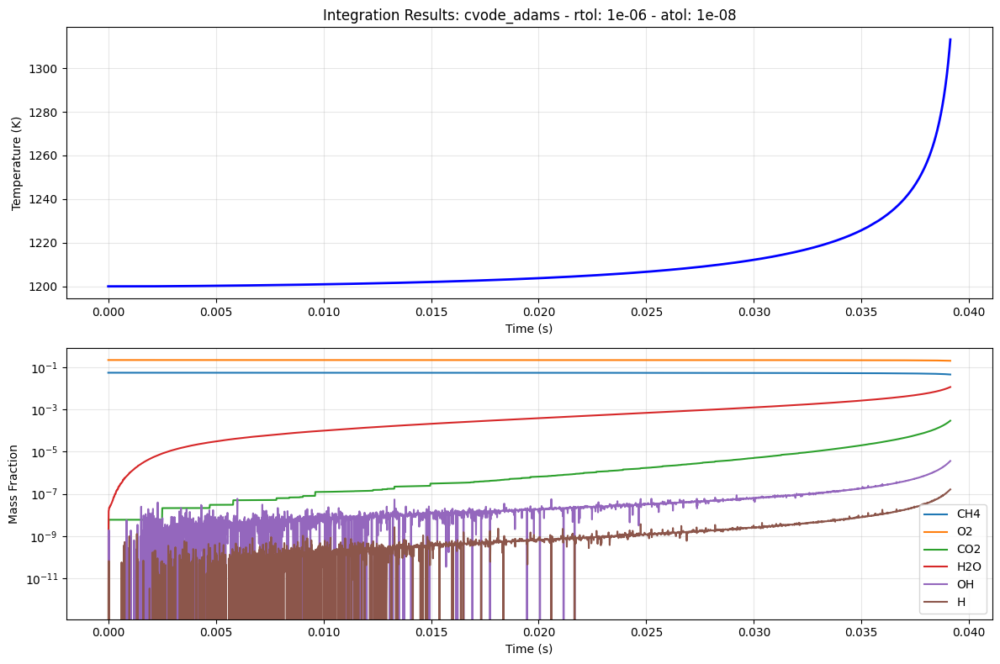

Running arkode_erk with tolerance (1e-06, 1e-08)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 1.84e-03s - time taken 0.00s | 1.84e-03s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 3.88e-04s - time taken 0.00s | 2.23e-03s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 3.25e-04s - time taken 0.00s | 2.55e-03s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 3.02e-04s - time taken 0.00s | 2.86e-03s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 3.34e-04s - time taken 0.00s | 3.19e-03s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 2.52e-04s - time taken 0.00s | 3.44e-03s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 2.48e-04s - time taken 0.00s | 3.69e-03s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 4.03e-04s - time taken 0.00s | 4.09e-03s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 3.56e-04s - time taken 0.01s | 4.45e-03s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 2.56e-04s -

[ERROR][rank 0][/home/conda/feedstock_root/build_artifacts/sundials-split_1742999320892/work/sundials/src/arkode/arkode.c:808][ARKodeEvolve] At t = 0.0393597, mxstep steps taken before reaching tout.


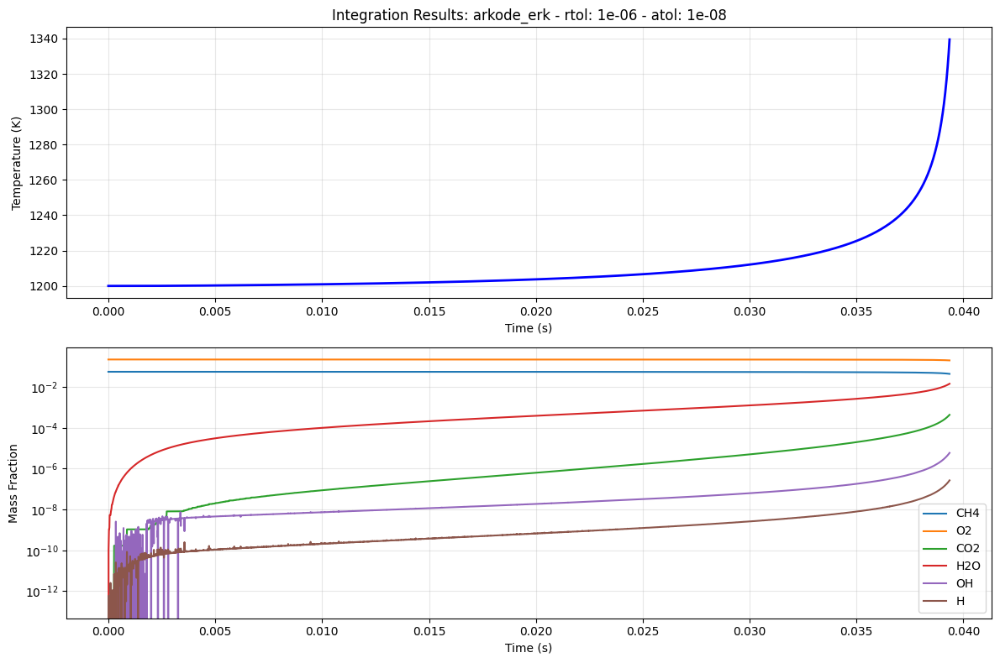

Running cpp_rk23 with tolerance (1e-06, 1e-08)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 4.86e-04s - time taken 0.00s | 4.86e-04s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 3.90e-04s - time taken 0.00s | 8.76e-04s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 6.91e-04s - time taken 0.00s | 1.57e-03s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 4.94e-05s - time taken 0.00s | 1.62e-03s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 4.63e-05s - time taken 0.00s | 1.66e-03s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 4.65e-05s - time taken 0.00s | 1.71e-03s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 4.48e-05s - time taken 0.00s | 1.75e-03s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 4.53e-05s - time taken 0.00s | 1.80e-03s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 6.68e-05s - time taken 0.00s | 1.87e-03s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 4.41e-05s - t

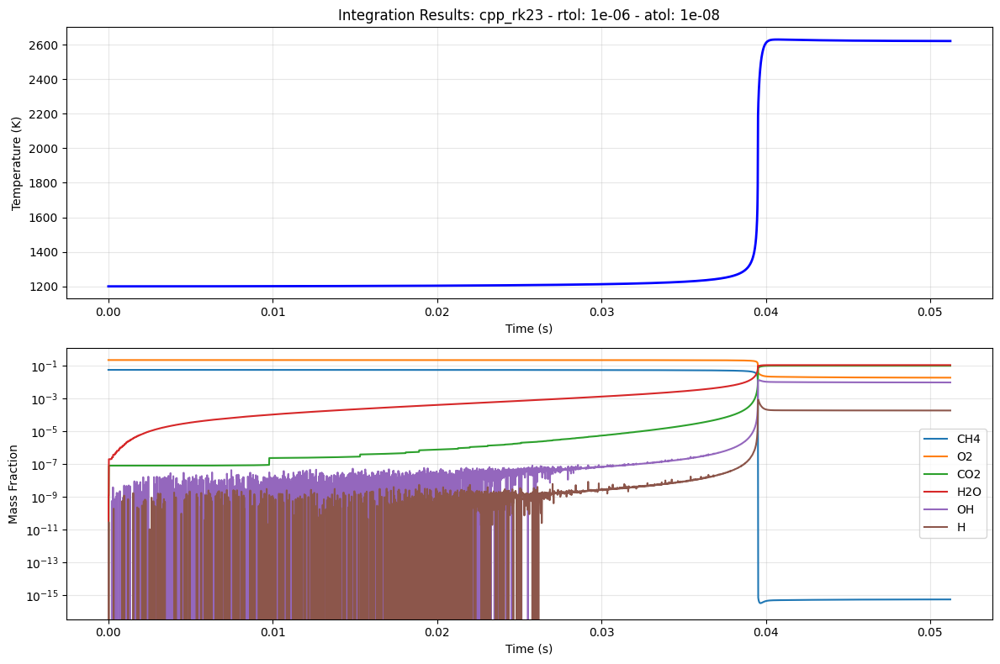

Running scipy_lsoda_none with tolerance (1e-06, 1e-08)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 3.12e-03s - time taken 0.00s | 3.12e-03s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 3.27e-03s - time taken 0.01s | 6.39e-03s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 2.45e-03s - time taken 0.01s | 8.84e-03s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 2.04e-03s - time taken 0.01s | 1.09e-02s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 1.83e-03s - time taken 0.01s | 1.27e-02s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 1.24e-04s - time taken 0.01s | 1.28e-02s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 1.27e-03s - time taken 0.02s | 1.41e-02s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 1.08e-02s - time taken 0.03s | 2.49e-02s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 7.76e-04s - time taken 0.03s | 2.57e-02s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 5.80e

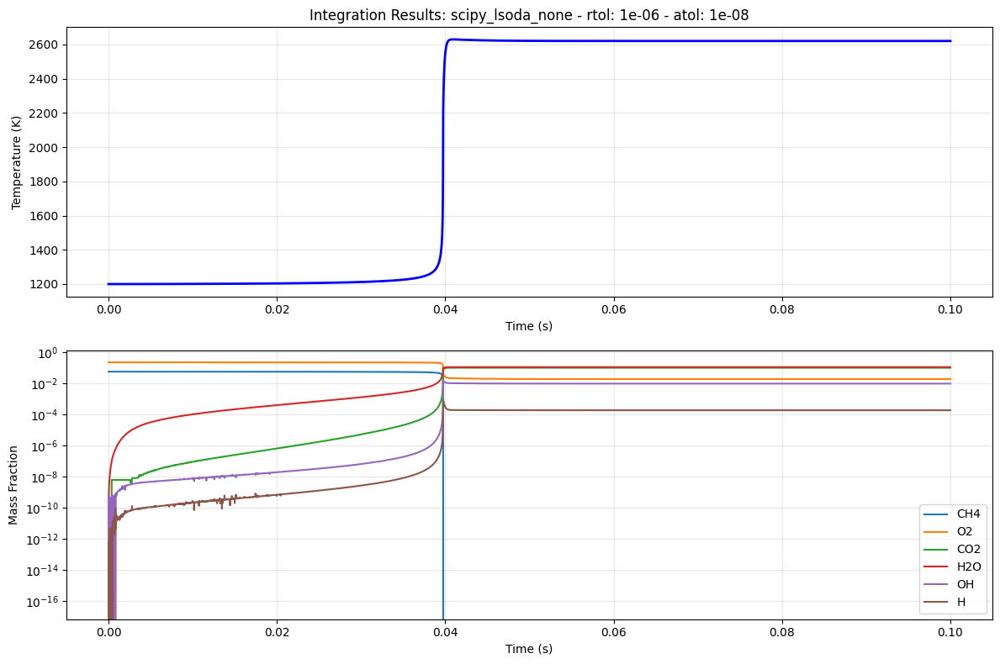

Running scipy_vode_bdf with tolerance (1e-06, 1e-08)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 2.20e-04s - time taken 0.00s | 2.20e-04s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 2.32e-04s - time taken 0.00s | 4.52e-04s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 4.02e-04s - time taken 0.00s | 8.54e-04s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 1.65e-04s - time taken 0.00s | 1.02e-03s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 1.68e-04s - time taken 0.00s | 1.19e-03s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 1.80e-04s - time taken 0.00s | 1.37e-03s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 1.92e-04s - time taken 0.00s | 1.56e-03s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 1.84e-04s - time taken 0.00s | 1.74e-03s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 2.17e-04s - time taken 0.00s | 1.96e-03s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 1.85e-0

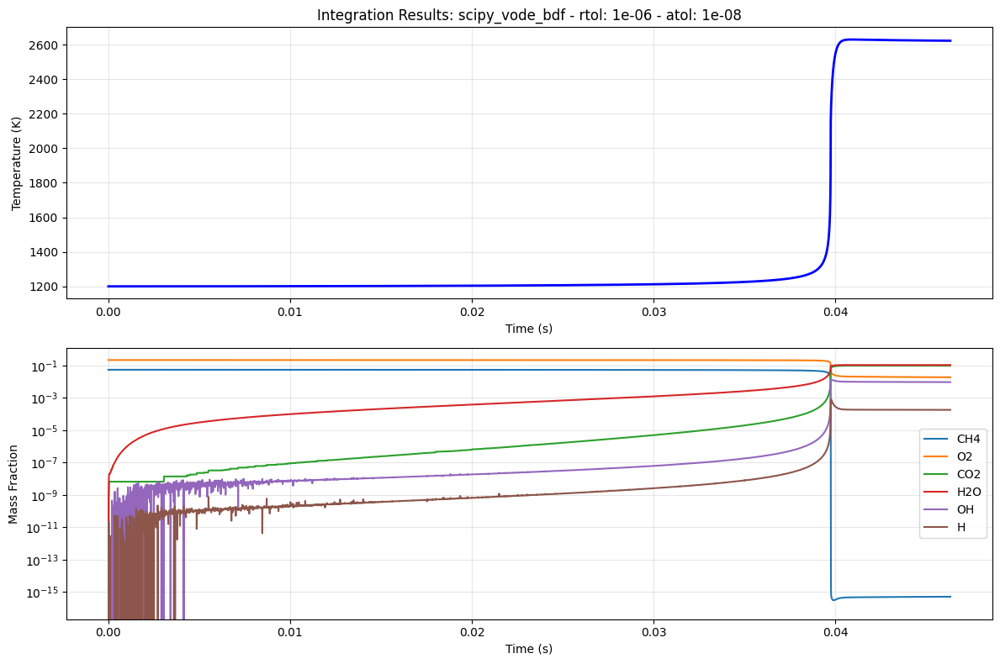

Running scipy_vode_adams with tolerance (1e-06, 1e-08)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 3.62e-04s - time taken 0.00s | 3.62e-04s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 4.30e-04s - time taken 0.00s | 7.93e-04s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 9.99e-04s - time taken 0.00s | 1.79e-03s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 1.87e-04s - time taken 0.00s | 1.98e-03s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 1.84e-04s - time taken 0.00s | 2.16e-03s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 4.09e-04s - time taken 0.00s | 2.57e-03s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 3.03e-04s - time taken 0.01s | 2.88e-03s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 1.80e-04s - time taken 0.01s | 3.06e-03s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 2.81e-04s - time taken 0.01s | 3.34e-03s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 1.57e

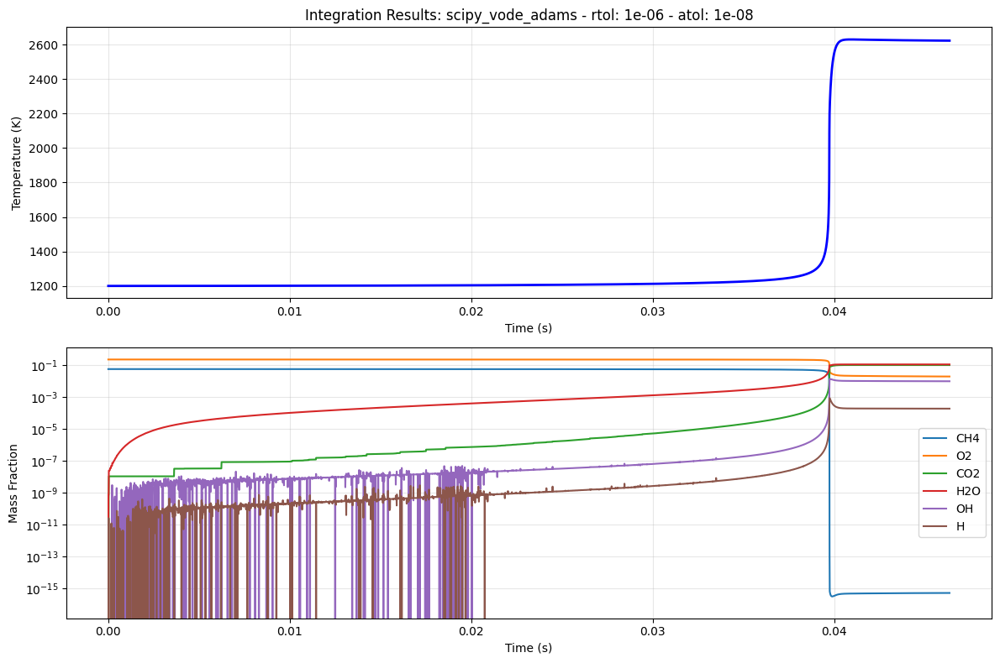

Running cvode_bdf with tolerance (1e-08, 1e-10)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 1.18e-03s - time taken 0.00s | 1.18e-03s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 1.58e-03s - time taken 0.00s | 2.76e-03s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 1.57e-03s - time taken 0.01s | 4.33e-03s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 1.54e-03s - time taken 0.01s | 5.87e-03s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 1.70e-03s - time taken 0.01s | 7.58e-03s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 2.96e-03s - time taken 0.01s | 1.05e-02s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 2.71e-03s - time taken 0.02s | 1.32e-02s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 1.35e-03s - time taken 0.02s | 1.46e-02s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 2.90e-03s - time taken 0.02s | 1.75e-02s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 4.15e-03s - 

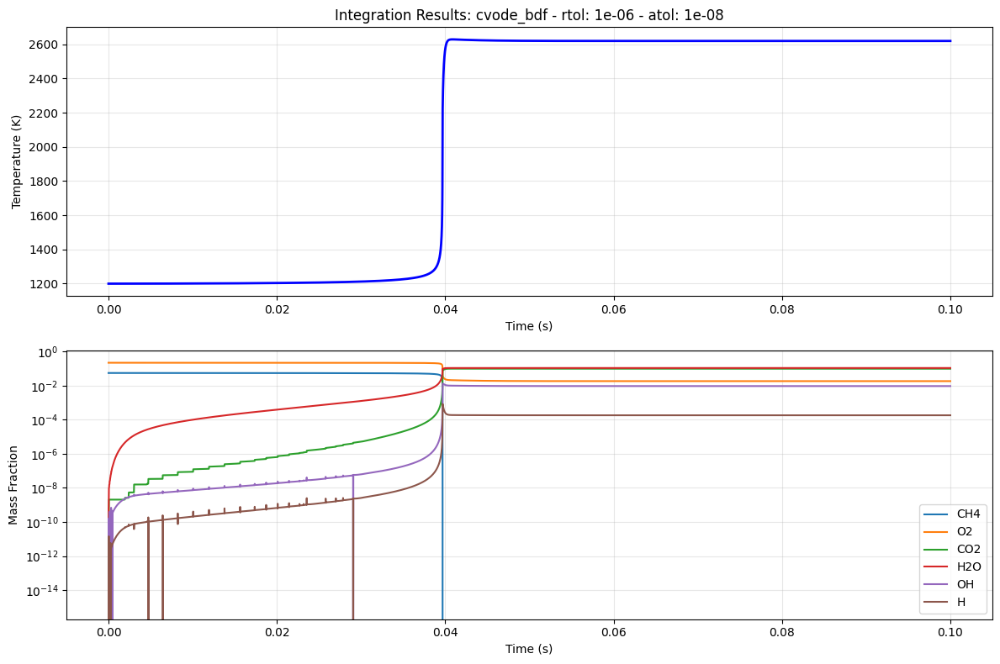

Running cvode_adams with tolerance (1e-08, 1e-10)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 1.98e-04s - time taken 0.00s | 1.98e-04s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 4.30e-04s - time taken 0.00s | 6.28e-04s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 1.75e-04s - time taken 0.00s | 8.03e-04s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 2.91e-04s - time taken 0.00s | 1.09e-03s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 3.07e-04s - time taken 0.00s | 1.40e-03s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 3.06e-04s - time taken 0.00s | 1.71e-03s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 2.96e-04s - time taken 0.00s | 2.00e-03s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 2.25e-04s - time taken 0.00s | 2.23e-03s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 3.40e-04s - time taken 0.01s | 2.57e-03s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 2.68e-04s 

[ERROR][rank 0][/home/conda/feedstock_root/build_artifacts/sundials-split_1742999320892/work/sundials/src/cvode/cvode.c:1428][CVode] At t = 0.0391395, mxstep steps taken before reaching tout.
CVODE solver error code: -1


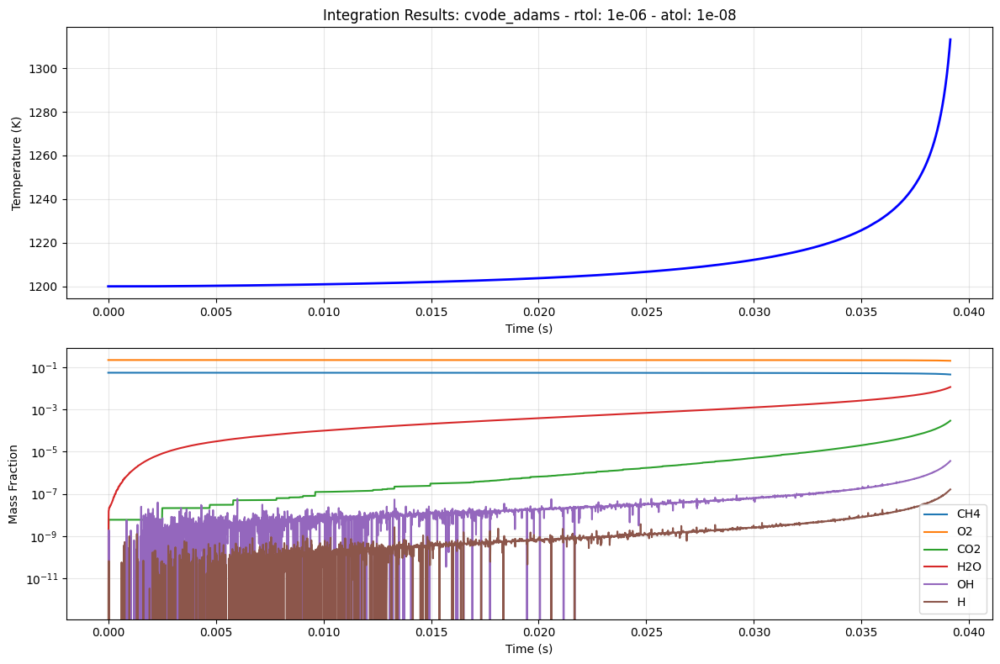

Running arkode_erk with tolerance (1e-08, 1e-10)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 2.72e-03s - time taken 0.00s | 2.72e-03s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 1.41e-03s - time taken 0.00s | 4.13e-03s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 1.10e-03s - time taken 0.01s | 5.23e-03s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 1.04e-03s - time taken 0.01s | 6.28e-03s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 1.09e-03s - time taken 0.01s | 7.36e-03s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 8.55e-04s - time taken 0.01s | 8.22e-03s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 8.33e-04s - time taken 0.01s | 9.05e-03s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 8.82e-03s - time taken 0.02s | 1.79e-02s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 1.59e-03s - time taken 0.02s | 1.95e-02s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 9.25e-04s -

[ERROR][rank 0][/home/conda/feedstock_root/build_artifacts/sundials-split_1742999320892/work/sundials/src/arkode/arkode.c:808][ARKodeEvolve] At t = 0.0393597, mxstep steps taken before reaching tout.


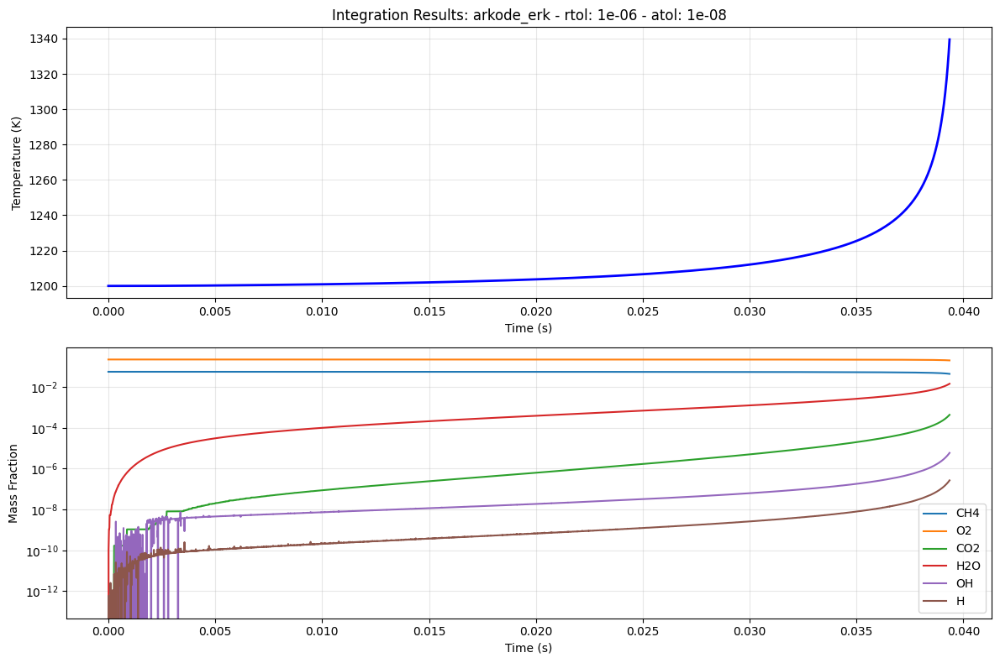

Running cpp_rk23 with tolerance (1e-08, 1e-10)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 3.30e-04s - time taken 0.00s | 3.30e-04s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 1.08e-04s - time taken 0.00s | 4.38e-04s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 6.53e-04s - time taken 0.00s | 1.09e-03s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 9.80e-05s - time taken 0.00s | 1.19e-03s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 9.85e-05s - time taken 0.00s | 1.29e-03s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 9.75e-05s - time taken 0.00s | 1.38e-03s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 1.07e-04s - time taken 0.00s | 1.49e-03s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 9.78e-05s - time taken 0.00s | 1.59e-03s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 9.68e-05s - time taken 0.00s | 1.69e-03s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 9.70e-05s - t

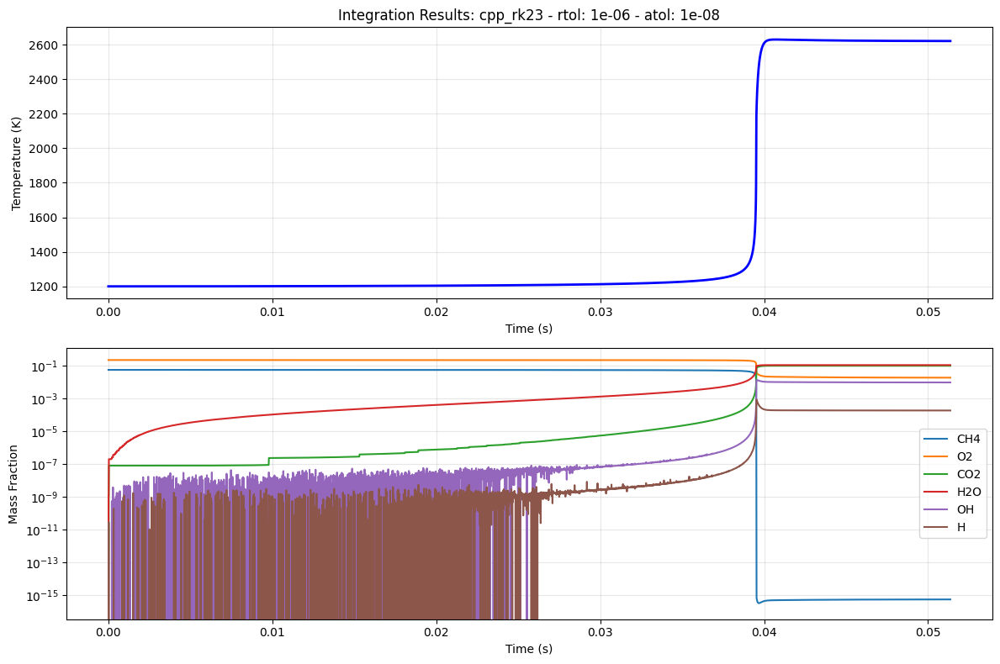

Running scipy_lsoda_none with tolerance (1e-08, 1e-10)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 1.64e-03s - time taken 0.00s | 1.64e-03s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 3.22e-03s - time taken 0.01s | 4.86e-03s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 1.88e-03s - time taken 0.01s | 6.75e-03s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 1.83e-03s - time taken 0.01s | 8.58e-03s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 1.79e-03s - time taken 0.01s | 1.04e-02s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 1.41e-04s - time taken 0.01s | 1.05e-02s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 9.23e-04s - time taken 0.01s | 1.14e-02s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 1.85e-03s - time taken 0.01s | 1.33e-02s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 1.45e-04s - time taken 0.01s | 1.34e-02s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 1.39e

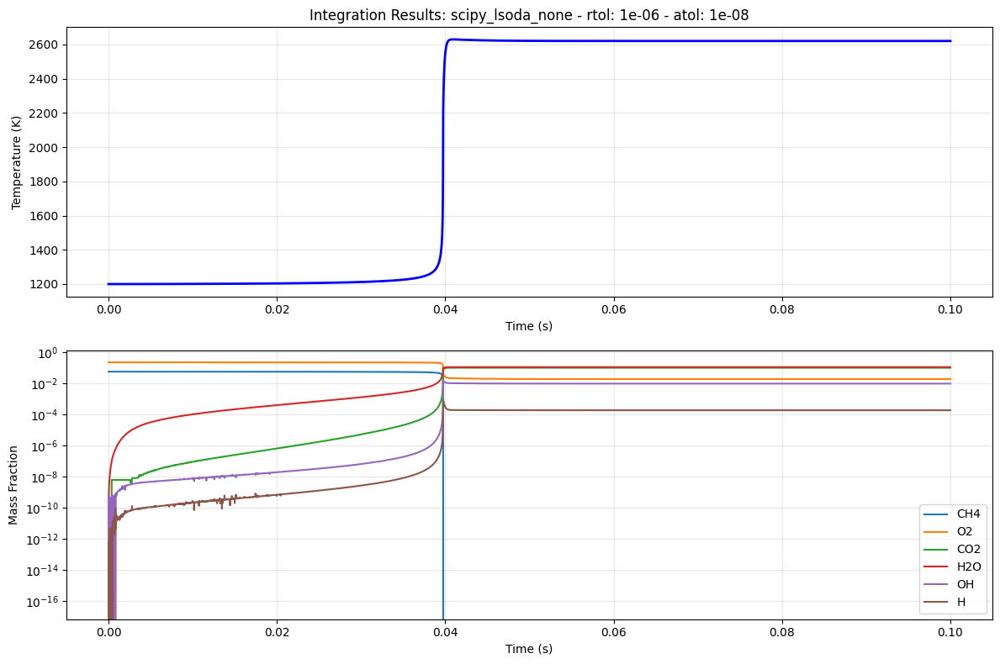

Running scipy_vode_bdf with tolerance (1e-08, 1e-10)
Step 1 at time 1.00e-05 - temperature 1200.0K - CPU time 3.18e-04s - time taken 0.00s | 3.18e-04s
Step 2 at time 2.00e-05 - temperature 1200.0K - CPU time 3.63e-04s - time taken 0.00s | 6.81e-04s
Step 3 at time 3.00e-05 - temperature 1200.0K - CPU time 6.78e-04s - time taken 0.00s | 1.36e-03s
Step 4 at time 4.00e-05 - temperature 1200.0K - CPU time 1.36e-04s - time taken 0.00s | 1.50e-03s
Step 5 at time 5.00e-05 - temperature 1200.0K - CPU time 1.67e-04s - time taken 0.00s | 1.66e-03s
Step 6 at time 6.00e-05 - temperature 1200.0K - CPU time 4.39e-04s - time taken 0.00s | 2.10e-03s
Step 7 at time 7.00e-05 - temperature 1200.0K - CPU time 1.27e-04s - time taken 0.00s | 2.23e-03s
Step 8 at time 8.00e-05 - temperature 1200.0K - CPU time 1.49e-04s - time taken 0.00s | 2.38e-03s
Step 9 at time 9.00e-05 - temperature 1200.0K - CPU time 1.20e-04s - time taken 0.00s | 2.50e-03s
Step 10 at time 1.00e-04 - temperature 1200.0K - CPU time 1.19e-0

KeyboardInterrupt: 

In [204]:
# Setup parameters
for tolerance in tolerances:
    for method in methods:
        print(f"Running {method} with tolerance {tolerance}")
        rtol = tolerance[0]
        atol = tolerance[1]
        end_time = 1e-1
        timestep = 1e-5
        name = f"{method}_{rtol}_{atol}"

        params = setup_experiment_parameters(rtol, atol, end_time, timestep)
        # Setup chemistry
        gas = setup_combustion_chemistry(
            params['mechanism'], params['fuel'], params['oxidizer'],
            params['phi'], params['temperature'], params['pressure']
        )

        # Get initial state
        y0 = get_initial_state(gas)
        t0 = 0.0

        # Run experiment
        results = run_integration_experiment(
            method, gas, y0, t0, params['end_time'], params['timestep'],
            params['rtol'], params['atol'], params['species_to_track'],
            time_limit=120.0
        )

        # Plot results
        plot_single_experiment(results, params['species_to_track'])

        all_results[name] = results